# CS551g - Practical 5 (PART 2) 

Have a look at the code below from this tutorial https://www.analyticsvidhya.com/blog/2020/06/guide-geospatial-analysis-folium-python/

You need to upload complete.csv and india.json using the file upload function

**TASK**

Adapt the code to display covid cases for Englad and Wales using the provided covid dataset covid-uk.csv  (https://www.kaggle.com/vascodegama/uk-covid19-data?select=UK_Local_Authority_UTLA_COVID_Dataset.csv) and scotland.json (from https://martinjc.github.io/UK-GeoJSON/)

You can try to visualise, for example,  newCasesByPublishDate 


In [35]:
pip install folium

In [36]:
pip install geopandas

In [37]:
import numpy as np
import pandas as pd

# For plotting maps
import folium

# For Regular Expressions
import re

# For working with geographical data
import geopandas

# For plotting in python
import matplotlib
import matplotlib.pyplot as plt

from branca.element import Figure

In [38]:
df_covid=pd.read_csv('/content/covid-UK.csv')
df_covid.head()

,date,areaName,areaCode,newCasesByPublishDate,cumCasesByPublishDate,newDeaths28DaysByPublishDate,cumDeaths28DaysByPublishDate,cumDeaths28DaysByPublishDateRate,newDeaths28DaysByDeathDate,cumDeaths28DaysByDeathDate,cumDeaths28DaysByDeathDateRate
0,2020-01-05,Aberdeen City,S12000033,0,NaN,0,NaN,NaN,NaN,NaN,NaN
1,2020-01-06,Aberdeen City,S12000033,0,NaN,0,NaN,NaN,NaN,NaN,NaN
2,2020-01-07,Aberdeen City,S12000033,0,NaN,0,NaN,NaN,NaN,NaN,NaN
3,2020-01-08,Aberdeen City,S12000033,0,NaN,0,NaN,NaN,NaN,NaN,NaN
4,2020-01-09,Aberdeen City,S12000033,0,NaN,0,NaN,NaN,NaN,NaN,NaN


In [39]:
scotland_geojson=geopandas.read_file('/content/scotland.json')
scotland_geojson.head()

,id,LAD13CD,LAD13CDO,LAD13NM,LAD13NMW,geometry
0,S12000005,S12000005,00QF,Clackmannanshire,None,"MULTIPOLYGON (((-3.81662 56.10246, -3.82137 56..."
1,S12000006,S12000006,00QH,Dumfries and Galloway,None,"MULTIPOLYGON (((-4.41187 54.68057, -4.41267 54..."
2,S12000008,S12000008,00QK,East Ayrshire,None,"POLYGON ((-4.24701 55.67894, -4.24701 55.67396..."
3,S12000010,S12000010,00QM,East Lothian,None,"MULTIPOLYGON (((-2.36692 55.94613, -2.36692 55..."
4,S12000011,S12000011,00QN,East Renfrewshire,None,"POLYGON ((-4.25097 55.78482, -4.25097 55.78171..."


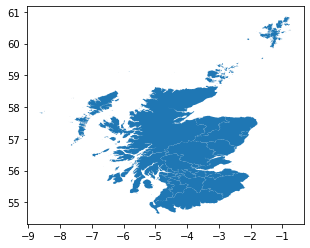

In [40]:
scotland_geojson.plot()

In [41]:
df_covid.isnull().sum()

date                                    0
areaName                                0
areaCode                                0
newCasesByPublishDate                   0
cumCasesByPublishDate               67476
newDeaths28DaysByPublishDate            0
cumDeaths28DaysByPublishDate        40300
cumDeaths28DaysByPublishDateRate    40300
newDeaths28DaysByDeathDate          12920
cumDeaths28DaysByDeathDate          12920
cumDeaths28DaysByDeathDateRate      12920
dtype: int64

In [42]:
df_covid.dtypes

date                                 object
areaName                             object
areaCode                             object
newCasesByPublishDate                 int64
cumCasesByPublishDate               float64
newDeaths28DaysByPublishDate          int64
cumDeaths28DaysByPublishDate        float64
cumDeaths28DaysByPublishDateRate    float64
newDeaths28DaysByDeathDate          float64
cumDeaths28DaysByDeathDate          float64
cumDeaths28DaysByDeathDateRate      float64
dtype: object

In [43]:
# We do not need the shift of time for the UK data as this is collected per day unlike India dataset. 
df_covid['date']=pd.to_datetime(df_covid['date'])#.apply(lambda x: x - pd.DateOffset(days=1))

In [44]:
df_covid['areaName'].unique()

array(['Aberdeen City', 'Aberdeenshire', 'Angus', 'Argyll and Bute',
       'Barking and Dagenham', 'Barnet', 'Barnsley',
       'Bath and North East Somerset', 'Bedford', 'Bexley', 'Birmingham',
       'Blackburn with Darwen', 'Blackpool', 'Bolton',
       'Bournemouth, Christchurch and Poole', 'Bracknell Forest',
       'Bradford', 'Brent', 'Brighton and Hove', 'Bristol, City of',
       'Bromley', 'Buckinghamshire', 'Bury', 'Calderdale',
       'Cambridgeshire', 'Camden', 'Central Bedfordshire',
       'Cheshire East', 'Cheshire West and Chester', 'City of Edinburgh',
       'Clackmannanshire', 'Cornwall and Isles of Scilly',
       'County Durham', 'Coventry', 'Croydon', 'Cumbria', 'Darlington',
       'Derby', 'Derbyshire', 'Devon', 'Doncaster', 'Dorset', 'Dudley',
       'Dumfries and Galloway', 'Dundee City', 'Ealing', 'East Ayrshire',
       'East Dunbartonshire', 'East Lothian', 'East Renfrewshire',
       'East Riding of Yorkshire', 'East Sussex', 'Enfield', 'Essex',
       '

In [45]:
# # Replace Incorrect Codes
df_covid['areaCode'] = df_covid['areaCode'].replace('S12000047', 'S12000015')
df_covid['areaCode'] = df_covid['areaCode'].replace('S12000048', 'S12000024')
df_covid['areaCode'] = df_covid['areaCode'].replace('S12000050', 'S12000044')
df_covid['areaCode'] = df_covid['areaCode'].replace('S12000049', 'S12000046')

# Creating IDs using the above dictionary
df_covid['state_id']=df_covid['areaCode']

# Remove England and Wales
keep_list = []
for f in scotland_geojson['id']:
  keep_list.append(f)

df_covid = df_covid[df_covid['state_id'].isin(keep_list)]

In [46]:
# For an example cumulative cases by publish date are used, filling NaN with 0
df_covid['cumCasesByPublishDate'] = df_covid['cumCasesByPublishDate'].fillna(0)

df_covid['Active Cases']=df_covid['cumCasesByPublishDate']

In [47]:
bins=np.linspace(min(df_covid['Active Cases']),max(df_covid['Active Cases']),11)

# Adds an extra bin to take into account 0 cases and assign its colour to white
bins = np.insert(bins, 0, -1., axis=0)
bins

array([-1.00000e+00,  0.00000e+00,  3.56840e+03,  7.13680e+03,
        1.07052e+04,  1.42736e+04,  1.78420e+04,  2.14104e+04,
        2.49788e+04,  2.85472e+04,  3.21156e+04,  3.56840e+04])

In [48]:
# Coloring states and UTs with active COVID-19 cases
df_covid['color']=pd.cut(df_covid['Active Cases'],bins,labels=['#FFFFFF','#FFEBEB','#F8D2D4','#F2B9BE','#EBA1A8','#E58892','#DE6F7C','#D85766','#D13E50','#CB253A','#C50D24'],include_lowest=False)


In [49]:
df_covid=df_covid[['date','areaCode','color']]
df_covid.head()

,date,areaCode,color
0,2020-01-05,S12000033,#FFFFFF
1,2020-01-06,S12000033,#FFFFFF
2,2020-01-07,S12000033,#FFFFFF
3,2020-01-08,S12000033,#FFFFFF
4,2020-01-09,S12000033,#FFFFFF


In [50]:
for date in df_covid['date'].unique():
    diff=set([str(i) for i in range(37)])-set(df_covid[df_covid['date']==date]['areaCode'])
    for i in diff:
      df_covid=pd.concat([df_covid,pd.DataFrame([[date,'#0073CF',i]],columns=['date','color','areaCode'])],ignore_index=True)
df_covid.sort_values('date',inplace=True)

In [51]:
df_covid['date']=(df_covid['date'].astype(int)// 10**9).astype('U10')
covid_dict={}
for i in df_covid['areaCode'].unique():
    covid_dict[i]={}
    for j in df_covid[df_covid['areaCode']==i].set_index(['areaCode']).values:   
        covid_dict[i][j[0]]={'color':j[1],'opacity':0.7}
covid_dict.popitem()

('S12000006',
 {'1578182400': {'color': '#FFFFFF', 'opacity': 0.7},
  '1578268800': {'color': '#FFFFFF', 'opacity': 0.7},
  '1578355200': {'color': '#FFFFFF', 'opacity': 0.7},
  '1578441600': {'color': '#FFFFFF', 'opacity': 0.7},
  '1578528000': {'color': '#FFFFFF', 'opacity': 0.7},
  '1578614400': {'color': '#FFFFFF', 'opacity': 0.7},
  '1578700800': {'color': '#FFFFFF', 'opacity': 0.7},
  '1578787200': {'color': '#FFFFFF', 'opacity': 0.7},
  '1578873600': {'color': '#FFFFFF', 'opacity': 0.7},
  '1578960000': {'color': '#FFFFFF', 'opacity': 0.7},
  '1579046400': {'color': '#FFFFFF', 'opacity': 0.7},
  '1579132800': {'color': '#FFFFFF', 'opacity': 0.7},
  '1579219200': {'color': '#FFFFFF', 'opacity': 0.7},
  '1579305600': {'color': '#FFFFFF', 'opacity': 0.7},
  '1579392000': {'color': '#FFFFFF', 'opacity': 0.7},
  '1579478400': {'color': '#FFFFFF', 'opacity': 0.7},
  '1579564800': {'color': '#FFFFFF', 'opacity': 0.7},
  '1579651200': {'color': '#FFFFFF', 'opacity': 0.7},
  '1579737600'

In [52]:
list(covid_dict.items())

[('S12000033',
  {'1578182400': {'color': '#FFFFFF', 'opacity': 0.7},
   '1578268800': {'color': '#FFFFFF', 'opacity': 0.7},
   '1578355200': {'color': '#FFFFFF', 'opacity': 0.7},
   '1578441600': {'color': '#FFFFFF', 'opacity': 0.7},
   '1578528000': {'color': '#FFFFFF', 'opacity': 0.7},
   '1578614400': {'color': '#FFFFFF', 'opacity': 0.7},
   '1578700800': {'color': '#FFFFFF', 'opacity': 0.7},
   '1578787200': {'color': '#FFFFFF', 'opacity': 0.7},
   '1578873600': {'color': '#FFFFFF', 'opacity': 0.7},
   '1578960000': {'color': '#FFFFFF', 'opacity': 0.7},
   '1579046400': {'color': '#FFFFFF', 'opacity': 0.7},
   '1579132800': {'color': '#FFFFFF', 'opacity': 0.7},
   '1579219200': {'color': '#FFFFFF', 'opacity': 0.7},
   '1579305600': {'color': '#FFFFFF', 'opacity': 0.7},
   '1579392000': {'color': '#FFFFFF', 'opacity': 0.7},
   '1579478400': {'color': '#FFFFFF', 'opacity': 0.7},
   '1579564800': {'color': '#FFFFFF', 'opacity': 0.7},
   '1579651200': {'color': '#FFFFFF', 'opacity': 0

In [53]:
scotland_geojson['areaCode']=scotland_geojson['id']
scotland_geojson.drop(columns='id',inplace=True)
scotland_geojson

,LAD13CD,LAD13CDO,LAD13NM,LAD13NMW,geometry,areaCode
0,S12000005,00QF,Clackmannanshire,None,"MULTIPOLYGON (((-3.81662 56.10246, -3.82137 56...",S12000005
1,S12000006,00QH,Dumfries and Galloway,None,"MULTIPOLYGON (((-4.41187 54.68057, -4.41267 54...",S12000006
2,S12000008,00QK,East Ayrshire,None,"POLYGON ((-4.24701 55.67894, -4.24701 55.67396...",S12000008
3,S12000010,00QM,East Lothian,None,"MULTIPOLYGON (((-2.36692 55.94613, -2.36692 55...",S12000010
4,S12000011,00QN,East Renfrewshire,None,"POLYGON ((-4.25097 55.78482, -4.25097 55.78171...",S12000011
5,S12000013,00RJ,Eilean Siar,None,"MULTIPOLYGON (((-7.64972 56.78444, -7.64972 56...",S12000013
6,S12000014,00QQ,Falkirk,None,"POLYGON ((-3.51542 56.00218, -3.51621 56.00156...",S12000014
7,S12000015,00QR,Fife,None,"MULTIPOLYGON (((-3.30221 56.03083, -3.30221 56...",S12000015
8,S12000017,00QT,Highland,None,"MULTIPOLYGON (((-5.69512 56.50230, -5.69592 56...",S12000017
9,S12000018,00QU,Inverclyde,None,"POLYGON ((-4.61399 55.92994, -4.61478 55.92932...",S12000018


In [54]:
from folium.plugins import TimeSliderChoropleth

In [55]:
fig6=Figure(height=850,width=1000)
m6 = folium.Map([57, -4], tiles='cartodbpositron', zoom_start=7)
fig6.add_child(m6)

In [56]:
g = TimeSliderChoropleth(
    scotland_geojson.set_index('areaCode').to_json(),
    styledict=covid_dict
).add_to(m6)
m6